In [1]:
%load_ext autoreload
%autoreload 2

import os
import torch
import time
from omegaconf import OmegaConf
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import gc

from jutils import denorm
from jutils import ims_to_grid
from jutils import instantiate_from_config

while not os.path.exists('ldm'):
    %cd ..
assert os.path.exists('ldm')

from ldm.trainer import TrainerModuleLatentFlow

DEV = "cuda:0"
torch.cuda.empty_cache()
gc.collect()

/export/home/ra93jiz/dev/Img-IDM/scripts
/export/home/ra93jiz/dev/Img-IDM


80

In [2]:
global_seed = 0
np.random.seed(global_seed)
torch.manual_seed(global_seed)

logs_path = 'logs/tb_logs/data-analysis/imgs'
os.makedirs(logs_path, exist_ok=True)

_______________
#### Helper functions

In [3]:
def plot_image_grid_and_stats(images, denorm_func, grid_func, n_split=8, figsize=(20, 10)):

    # Stats on normalised imgs
    images_np = images.cpu().numpy()
    pixel_values = images_np.reshape(-1, 3)
    pixel_stats = {
        'mean': np.mean(pixel_values, axis=0),
        'std': np.std(pixel_values, axis=0),
        'min': np.min(pixel_values, axis=0),
        'max': np.max(pixel_values, axis=0)
    }

    # Denormalize images for visualization
    enc_ims = denorm_func(images).clamp_(0, 255).to(torch.uint8)
    enc_ims_grid = grid_func(enc_ims, stack="row", split=n_split)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    ax1.imshow(enc_ims_grid.cpu().numpy())
    ax1.axis('off')
    ax1.set_title('Image Grid', fontsize=14)

    sns.boxplot(data=pixel_values, ax=ax2)
    ax2.set_xticks([0, 1, 2])
    ax2.set_xticklabels(['Red', 'Green', 'Blue'], fontsize=12)
    ax2.set_title('Pixel Value Distribution', fontsize=14)
    ax2.set_ylabel('Pixel Intensity', fontsize=12)

    stats_text = (f"Mean: {pixel_stats['mean']}\n"
                  f"Std Dev: {pixel_stats['std']}\n"
                  f"Min: {pixel_stats['min']}\n"
                  f"Max: {pixel_stats['max']}")
    ax2.text(1.05, 0.5, stats_text, transform=ax2.transAxes, verticalalignment='center', fontsize=12)

    plt.tight_layout()
    plt.show()


In [4]:
def plot_pixel_stats_over_time(image_batches, timesteps=None, sample_interval=1, file_path=None):
    num_batches = len(image_batches)

    if timesteps is not None:
        assert len(timesteps) == num_batches, "Length of timesteps must match the number of image batches"
    else:
        timesteps = list(range(num_batches))
    
    if sample_interval <= 0:
        sample_interval = 1
    sampled_indices = range(0, num_batches, sample_interval)
    
    mean_values = []
    min_values = []
    max_values = []
    std_values = []
    sampled_timesteps = []
    
    for i in sampled_indices:
        batch = image_batches[i]
        
        # Flatten
        if isinstance(batch, torch.Tensor):
            batch = batch.flatten().detach().cpu().numpy()
        else:
            batch = batch.flatten()
        
        mean_values.append(np.mean(batch))
        min_values.append(np.min(batch))
        max_values.append(np.max(batch))
        std_values.append(np.std(batch))
        sampled_timesteps.append(timesteps[i])
    
    sns.set_palette("pastel")
    
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.fill_between(sampled_timesteps, 
                    np.array(mean_values) - np.array(std_values),
                    np.array(mean_values) + np.array(std_values),
                    alpha=0.3, color='gray', label='Standard Deviation')
    
    ax.plot(sampled_timesteps, mean_values, label='Mean', color=sns.color_palette()[0], linewidth=2)
    ax.plot(sampled_timesteps, min_values, label='Min', color=sns.color_palette()[1], linewidth=2)
    ax.plot(sampled_timesteps, max_values, label='Max', color=sns.color_palette()[2], linewidth=2)
    
    ax.axhline(y=-1, color='black', linestyle='--', alpha=0.7, linewidth=1.5)
    ax.axhline(y=1, color='black', linestyle='--', alpha=0.7, linewidth=1.5)
    
    ax.set_title('Pixel Value Statistics Over Time', fontsize=18, fontweight='bold')
    ax.set_xlabel('Time Step', fontsize=14)
    ax.set_ylabel('Pixel Value', fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    
    y_min = min(min(min_values), -1) - 0.1
    y_max = max(max(max_values), 1) + 0.1
    ax.set_ylim(y_min, y_max)
    
    ax.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
    ax.text(ax.get_xlim()[1], 1, '  y = 1', verticalalignment='bottom', horizontalalignment='left', color='black', fontsize=10)
    ax.text(ax.get_xlim()[1], -1, '  y = -1', verticalalignment='top', horizontalalignment='left', color='black', fontsize=10)
    ax.grid(True, linestyle=':', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    if file_path:
        fig.savefig(file_path, dpi=300, bbox_inches='tight')

#### Sanity test of the code

In [5]:
# Test code
batch_size = 64
channels = 3
image_size = (32,32)
num_batches = 100

_RTOL = 1e-5
_ATOL = 1e-5

#image_batches = [torch.randn(128, 32, 32, 3) * 0.5 + torch.sin(torch.tensor(i/10)) for i in range(10)]
batch = [torch.randn(batch_size, channels, *image_size) for _ in range(num_batches)]
x_sample = torch.cat(batch[:1], dim=0)

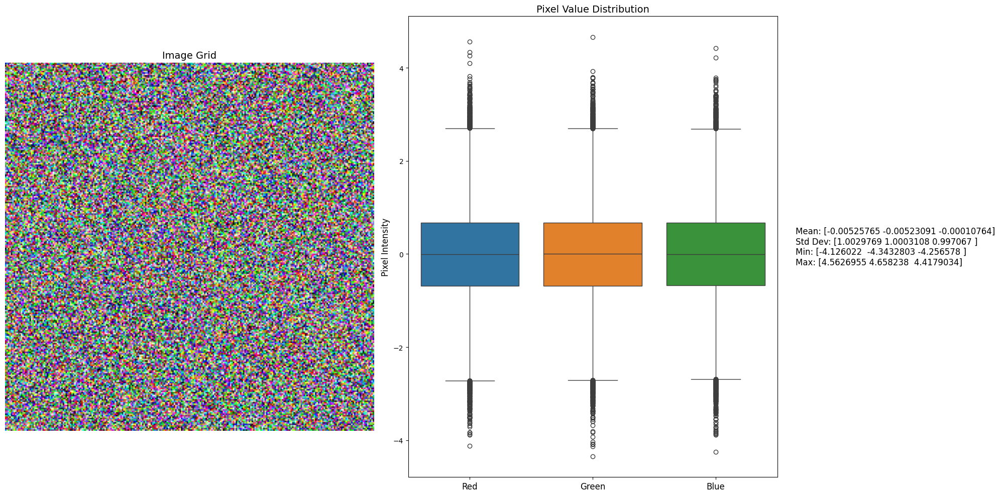

In [6]:
plot_image_grid_and_stats(x_sample, denorm, ims_to_grid)

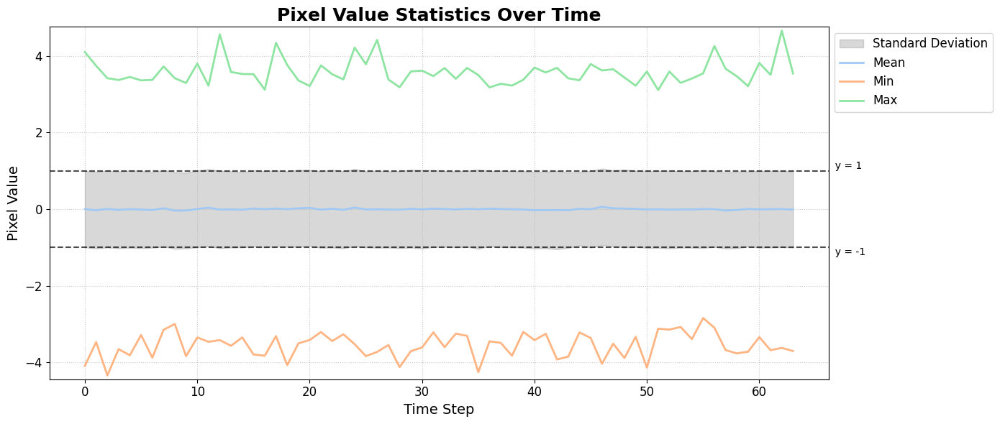

In [7]:
fig = plot_pixel_stats_over_time(x_sample)

______________________________
#### Plot sample images

In [8]:
bs = 64
cfg_fp = 'configs/data/cifar10.yaml'
cfg = OmegaConf.load(cfg_fp)
data = instantiate_from_config(cfg)
data.setup()

for batch in data.train_dataloader():
    for k, v in batch.items():
        if isinstance(v, torch.Tensor) or isinstance(v, np.ndarray):
            print(f"{k:<10} {v.shape}")
        elif isinstance(v, list):
            print(f"{k:<10} [{v[0]}, ...]")
        else:
            print(f"{k:<10} {type(v)}")
    break

x = batch['image'][:bs]
label = batch['label'][:bs]


Files already downloaded and verified
Files already downloaded and verified
image      torch.Size([64, 3, 32, 32])
label      torch.Size([64])


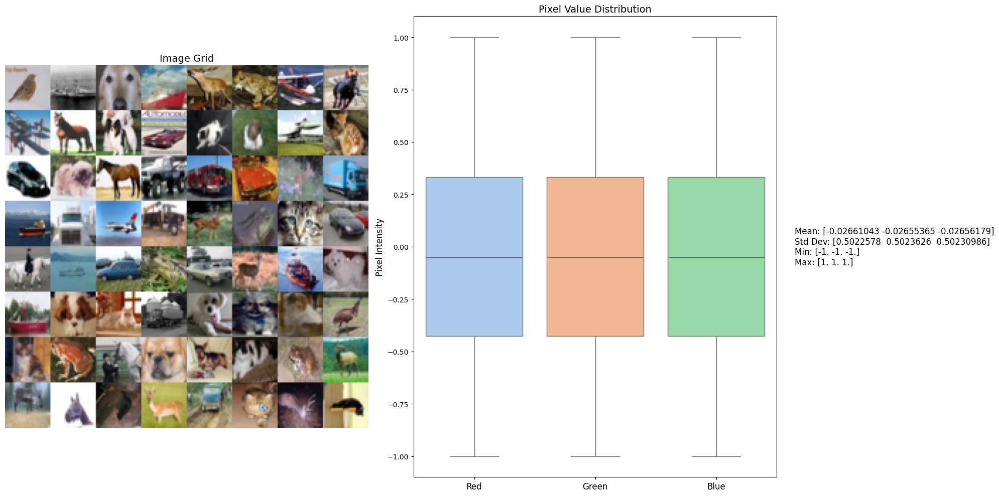

In [9]:
plot_image_grid_and_stats(x, denorm, ims_to_grid)

## Flow Matching Model

In [10]:
ckpt_fp = "logs/idm_logs/non_latent_comp/fm/v0_2024-09-03-20-11-22/checkpoints/step210000.ckpt"
module = TrainerModuleLatentFlow.load_from_checkpoint(ckpt_fp, map_location=DEV)
module.eval()

print(f"{sum([p.numel() for p in module.parameters() if p.requires_grad]):,}")

276,514,691


In [11]:
net = module.ema_model.model.net
fm = module.ema_model.model

In [12]:
n_intermediates = 1000
ode_kwargs = dict(method="euler", rtol=_RTOL, atol=_ATOL, options=dict(step_size=1./10))

# ----------- Encode

start_time = time.time()
with torch.no_grad():
    enc = fm.generate(
        x.to(DEV),
        n_intermediates=n_intermediates, 
        reverse=True,
        ode_kwargs=ode_kwargs)
    x10 = enc[10].cpu()

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken for one batch run: {elapsed_time:.4f} seconds")

print(enc.shape)

Time taken for one batch run: 2.2340 seconds
torch.Size([1002, 64, 3, 32, 32])


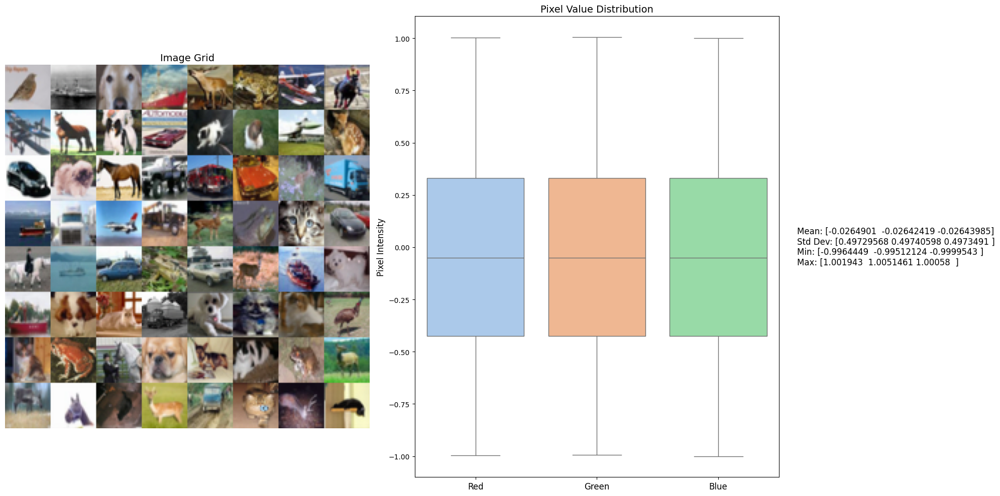

In [13]:
plot_image_grid_and_stats(x10, denorm, ims_to_grid)

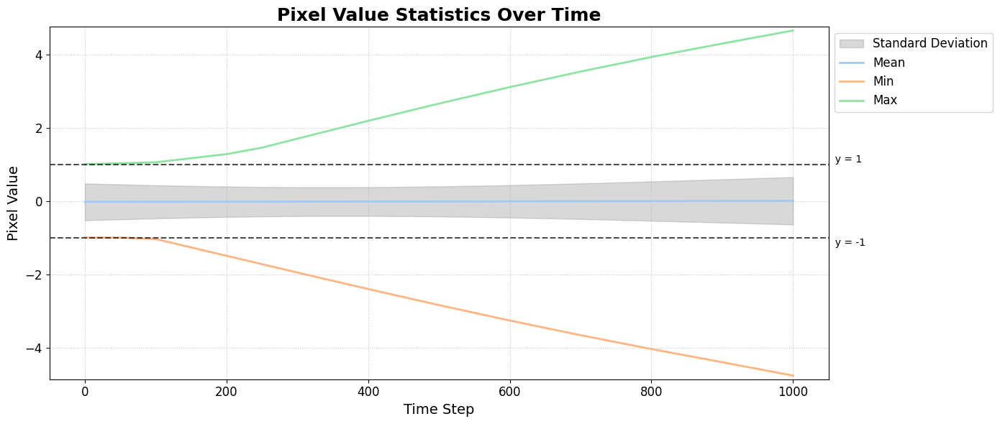

In [14]:
file_name = 'fm_enc_stats_clip.png'
full_path = os.path.join(logs_path, file_name)

fig = plot_pixel_stats_over_time(enc[1:], sample_interval=50, file_path=full_path)

#### Test Sample with generated batch of Gaussians 

In [15]:
# ----------- Decode

start_time = time.time()
with torch.no_grad():
    dec = fm.generate(
        x_sample.to(DEV),
        n_intermediates=0, 
        ode_kwargs=ode_kwargs,
        reverse=False)
    
    xt_hat = dec.cpu()
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken for one batch run: {elapsed_time:.4f} seconds")

print(dec.shape)

Time taken for one batch run: 1.5345 seconds
torch.Size([64, 3, 32, 32])


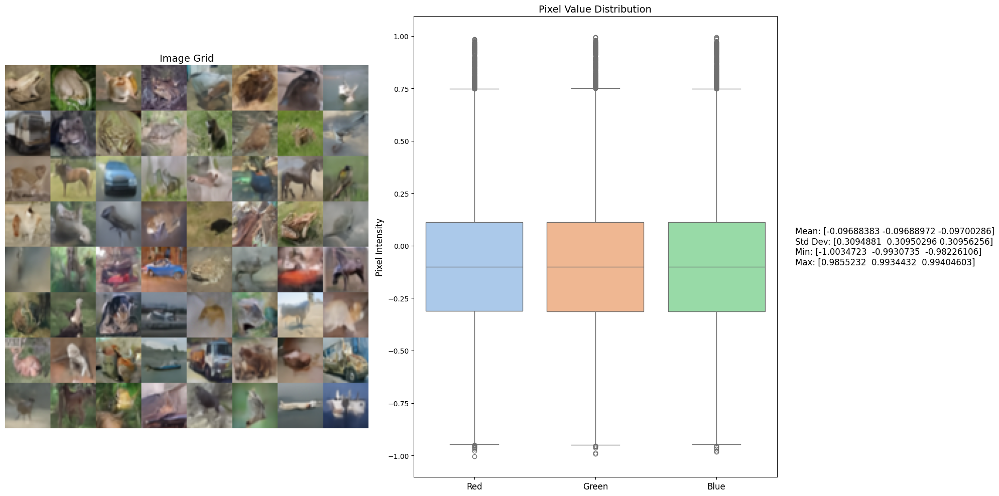

In [16]:
plot_image_grid_and_stats(xt_hat, denorm, ims_to_grid)

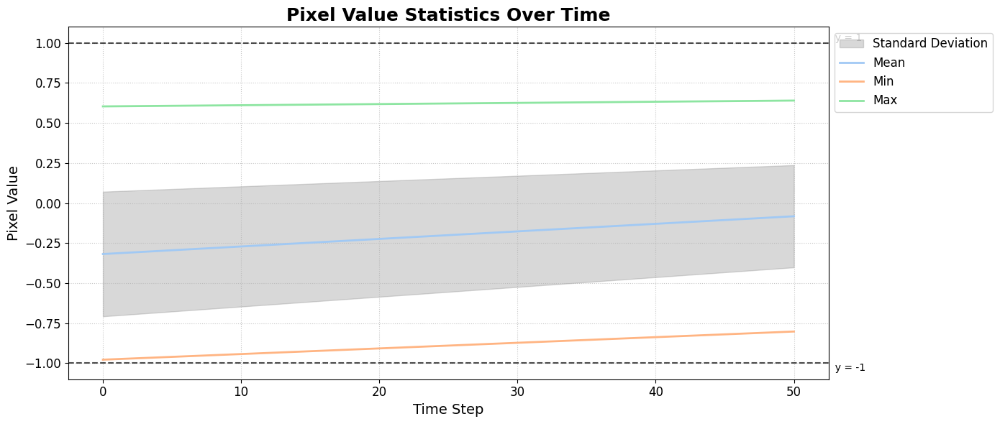

In [17]:
file_name = 'fm_dec_stats_gaussiantest_clip.png'
full_path = os.path.join(logs_path, file_name)

fig = plot_pixel_stats_over_time(dec[1:], sample_interval=50, file_path=full_path)

#### Test Sample with x10 Gaussian noise samples

In [20]:
default_ode_kwargs = dict(method="euler", rtol=_RTOL, atol=_ATOL, options=dict(step_size=1./10))
n_intermediates=1000

start_time = time.time()
with torch.no_grad():
    dec = fm.generate(
            x10.clone().to(DEV),
            reverse=False,
            n_intermediates=n_intermediates,
            ode_kwargs=ode_kwargs)
    xt_hat = dec.cpu()
print(dec.shape)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken for one batch run: {elapsed_time:.4f} seconds")

torch.Size([64, 3, 32, 32])
Time taken for one batch run: 1.4851 seconds


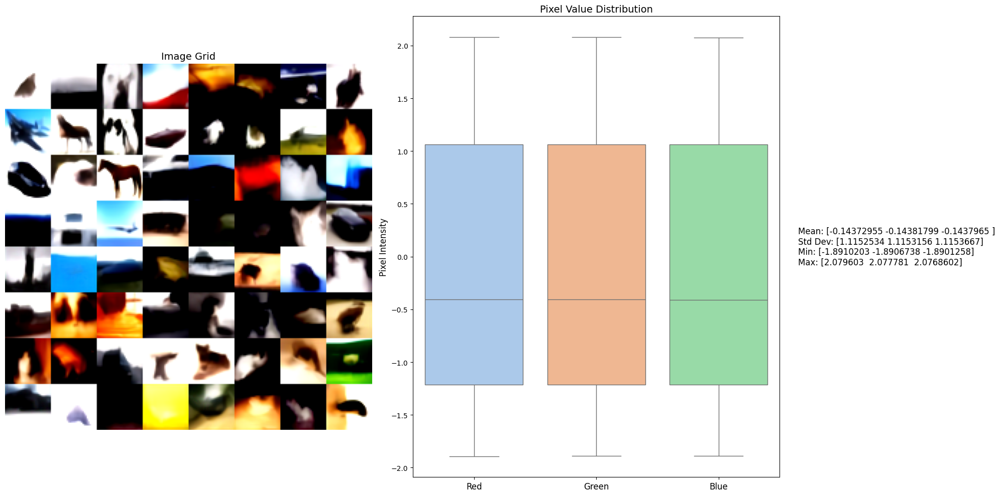

In [21]:
plot_image_grid_and_stats(xt_hat, denorm, ims_to_grid)

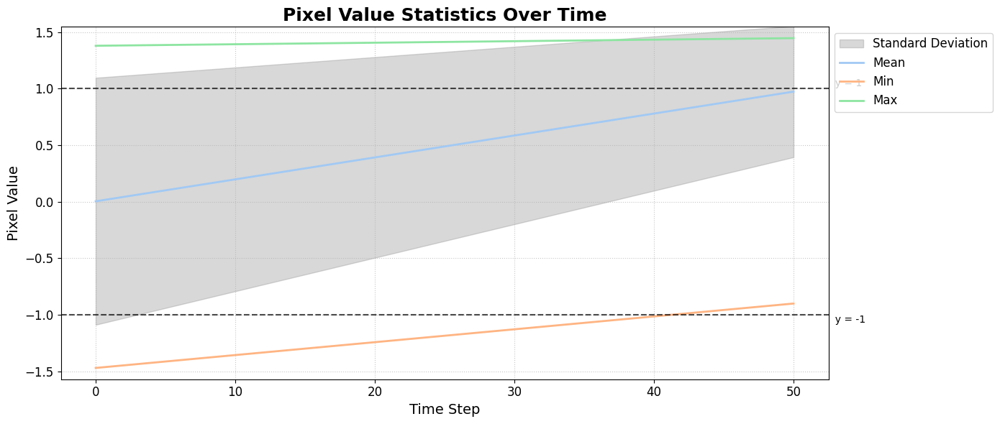

In [22]:
file_name = 'fm_dec_stats_clip.png'
full_path = os.path.join(logs_path, file_name)

fig = plot_pixel_stats_over_time(dec, sample_interval=50, file_path=full_path)

In [23]:
torch.cuda.empty_cache()
gc.collect()

29593

## Diffusion Model 

In [24]:
ckpt_fp = "logs/idm_logs/non_latent_comp/dm/v0_2024-09-03-20-11-37/checkpoints/step200000.ckpt"
module = TrainerModuleLatentFlow.load_from_checkpoint(ckpt_fp, map_location=DEV)
module.eval()

print(f"{sum([p.numel() for p in module.parameters() if p.requires_grad]):,}")

276,514,691


In [25]:
net = module.ema_model.model.net
ddim = module.ema_model.model.ddim_sampler

#### Inference

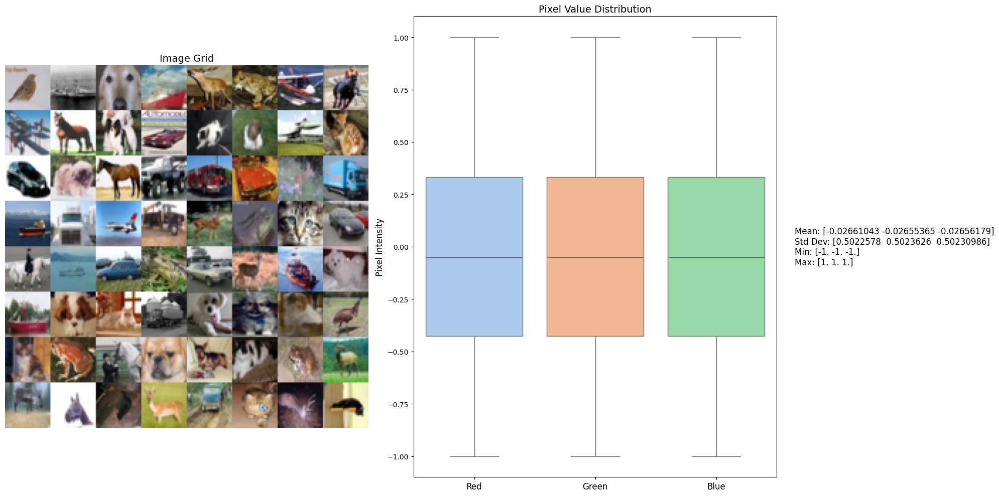

In [26]:
x = batch['image'][:bs]
label = batch['label'][:bs]

plot_image_grid_and_stats(x, denorm, ims_to_grid)

In [27]:
t_enc_depth = None
n_intermediates = 1000
start_time = time.time()

with torch.no_grad():
    enc, out = ddim.encode(
        net,
        x.to(DEV),
        t_enc=t_enc_depth,
        n_intermediates=n_intermediates,
        use_original_steps=True,
    )
    
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken for one batch run: {elapsed_time:.4f} seconds")

print(f"Final encoded shape: {enc.shape}")
print(f"Number of intermediates: {len(out['intermediates'])}")

Encoding x0:   6%|▌         | 61/1000 [00:08<02:17,  6.82it/s]

Encoding x0: 100%|██████████| 1000/1000 [02:27<00:00,  6.78it/s]

Time taken for one batch run: 147.4903 seconds
Final encoded shape: torch.Size([64, 3, 32, 32])
Number of intermediates: 1000


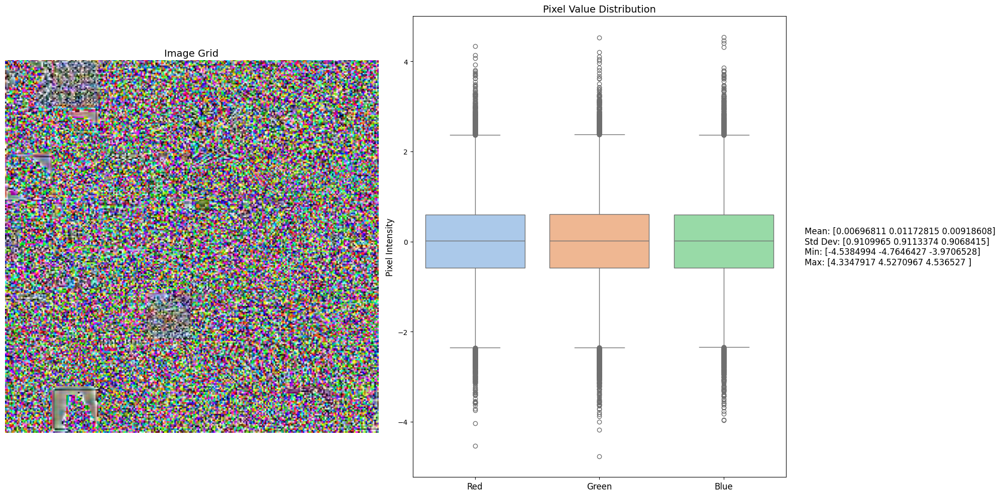

In [28]:
plot_image_grid_and_stats(enc, denorm, ims_to_grid)

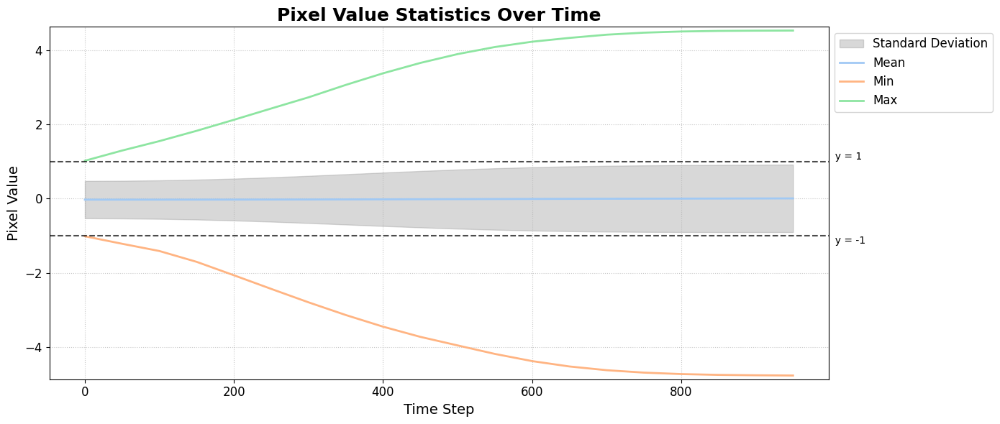

In [29]:
file_name = 'dm_enc_stats_clip.png'
full_path = os.path.join(logs_path, file_name)

fig = plot_pixel_stats_over_time(out['intermediates'], sample_interval=50, file_path=full_path)

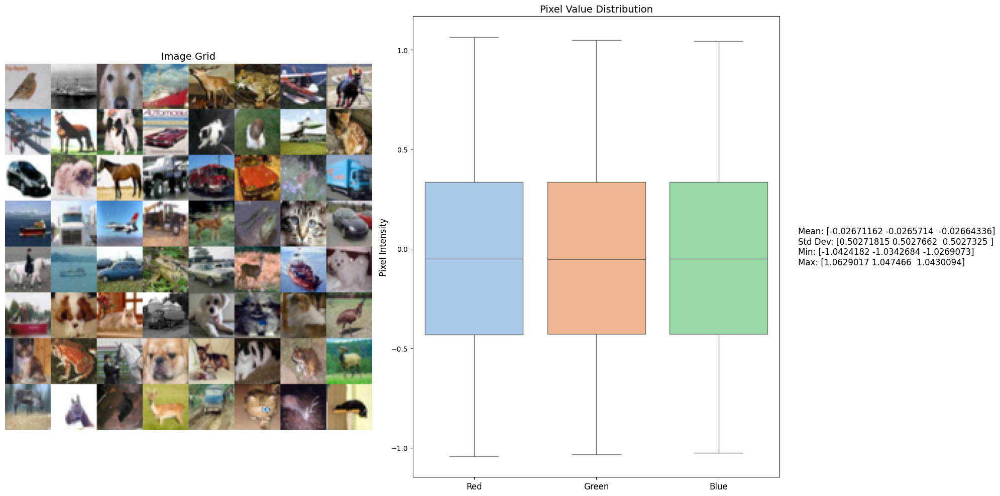

In [30]:
# Select an early Encoded sample 
idx = 5
x10 = out['intermediates'][idx]
t_step10 = out['intermediate_steps'][idx]

plot_image_grid_and_stats(x10, denorm, ims_to_grid)

#### Test with batch of generated Gaussian samples

In [31]:
n_intermediates=1000

start_time = time.time()
with torch.no_grad():
    dec, out = ddim.decode(
        net,
        x_sample.to(DEV),
        t_start=None,
        n_intermediates=n_intermediates,
        use_original_steps=True, # original steps
    )
    
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken for one batch run: {elapsed_time:.4f} seconds")

print(f"Decoded shape: {dec.shape}")

Decoding image:  21%|██        | 207/1000 [00:30<01:58,  6.72it/s]

Decoding image: 100%|██████████| 1000/1000 [02:28<00:00,  6.71it/s]

Time taken for one batch run: 149.0114 seconds
Decoded shape: torch.Size([64, 3, 32, 32])


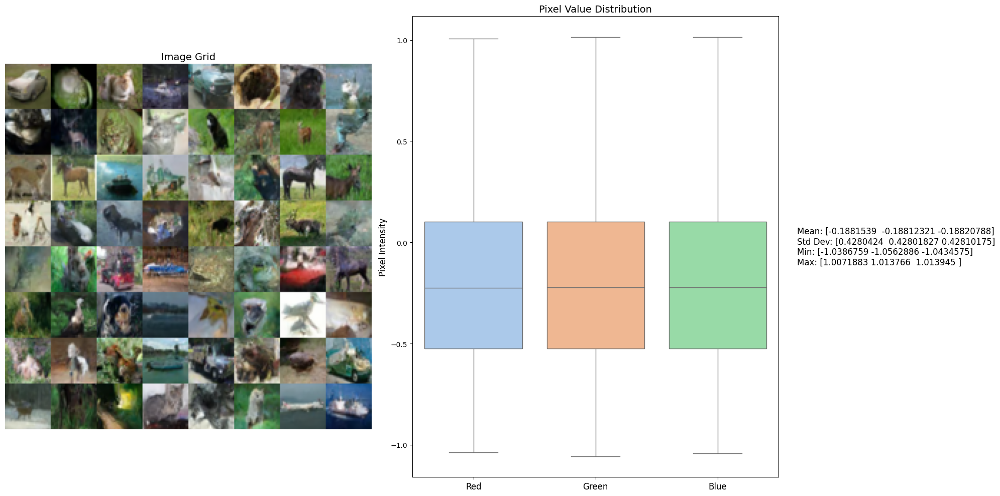

In [32]:
plot_image_grid_and_stats(dec, denorm, ims_to_grid)

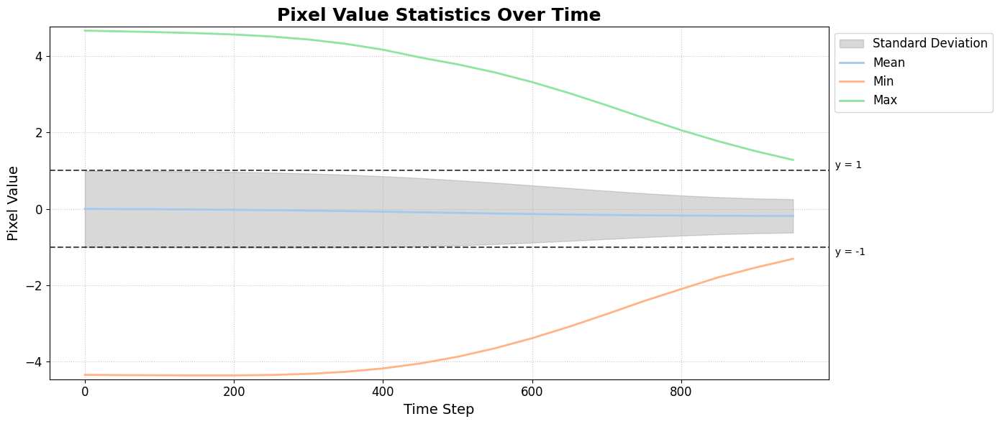

In [33]:
file_name = 'dm_dec_stats_gaussiantest_clip.png'
full_path = os.path.join(logs_path, file_name)

fig = plot_pixel_stats_over_time(out['intermediates'], sample_interval=50, file_path=full_path)

#### Test with encoded batch of x10 noisy samples

In [34]:
n_intermediates=1000
start_time = time.time()

with torch.no_grad():
    dec, out = ddim.decode(
        net,
        x10.to(DEV),
        t_start=t_step10,
        n_intermediates=n_intermediates,
        use_original_steps=True, # original steps
    )
    
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken for one batch run: {elapsed_time:.4f} seconds")
print(len(out['intermediates']))
print(dec.shape)

Decoding image: 100%|██████████| 5/5 [00:00<00:00,  6.62it/s]

Time taken for one batch run: 0.7631 seconds
5
torch.Size([64, 3, 32, 32])


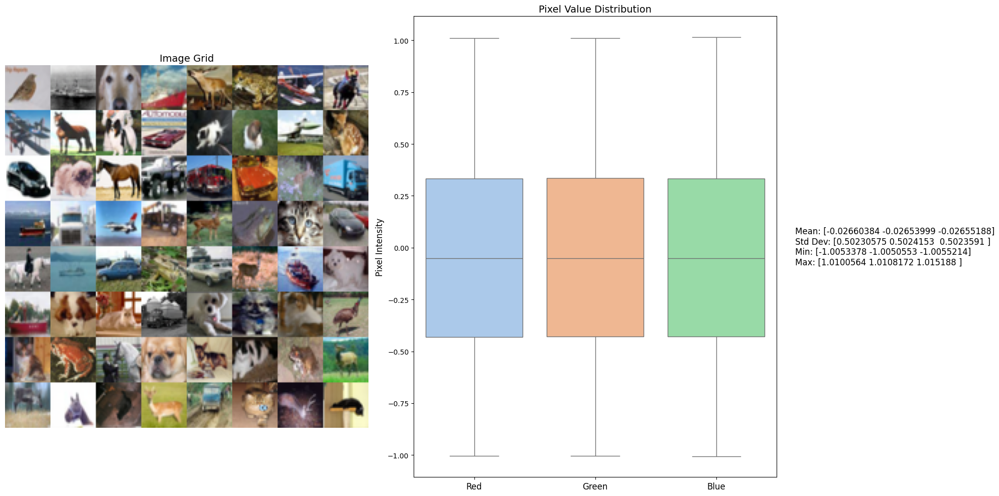

In [35]:
plot_image_grid_and_stats(dec, denorm, ims_to_grid)

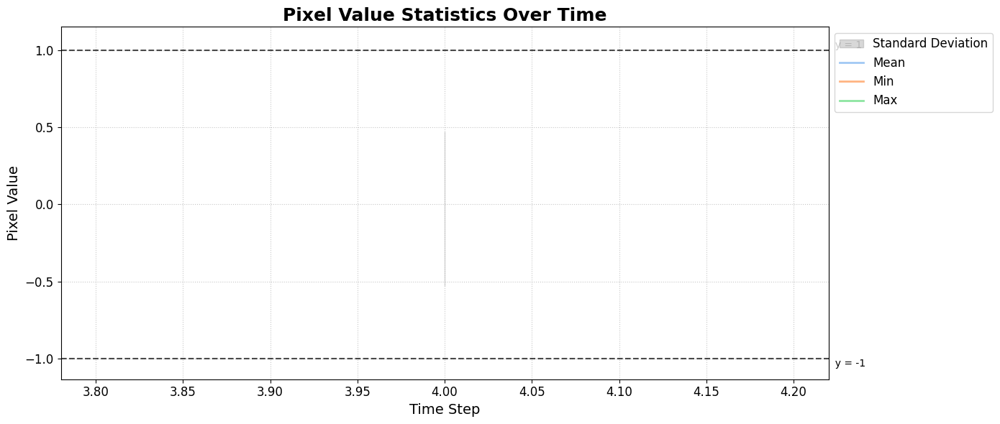

In [36]:
file_name = 'dm_dec_stats_clip.png'
full_path = os.path.join(logs_path, file_name)

plot_pixel_stats_over_time(out['intermediates'], timesteps=out['intermediate_steps'], sample_interval=50, file_path=full_path)

In [37]:
torch.cuda.empty_cache()
gc.collect()

43972